In [1]:
!pip install kaggle

In [2]:
import os, glob, zipfile
import shutil

# Path kaggle.json
kaggle_json_path = r"/home/amatistheting/kaggle.json"

# Path folder project
project_dir = r"/home/amatistheting/Project_1_Bank_Churn"

# Pastikan folder .kaggle ada di HOME
os.makedirs(os.path.expanduser("~/.kaggle"), exist_ok=True)

# Copy kaggle.json
shutil.copy(kaggle_json_path, os.path.expanduser("~/.kaggle/kaggle.json"))

# Set permission (tidak wajib di Windows)
try:
    os.chmod(os.path.expanduser("~/.kaggle/kaggle.json"), 0o600)
except:
    pass

# Pindah ke folder project
os.chdir(project_dir)

# Download dataset dari Kaggle
!kaggle datasets download -d gauravtopre/bank-customer-churn-dataset -p "{project_dir}"

# Ekstrak file zip menggunakan Python (cross-platform)
for zp in glob.glob(os.path.join(project_dir, "*.zip")):
    with zipfile.ZipFile(zp) as zf:
        zf.extractall(project_dir)
    os.remove(zp)   # opsional: hapus zip setelah ekstrak

print("✅ Unzip selesai di:", project_dir)


print("✅ Dataset berhasil diunduh dan diekstrak ke:", project_dir)


Dataset URL: https://www.kaggle.com/datasets/gauravtopre/bank-customer-churn-dataset
License(s): other
  0%|                                                | 0.00/187k [00:00<?, ?B/s]
100%|█████████████████████████████████████████| 187k/187k [00:00<00:00, 480MB/s]
  0%|                                                | 0.00/187k [00:00<?, ?B/s]
100%|█████████████████████████████████████████| 187k/187k [00:00<00:00, 480MB/s]
✅ Unzip selesai di: /home/amatistheting/Project_1_Bank_Churn
✅ Dataset berhasil diunduh dan diekstrak ke: /home/amatistheting/Project_1_Bank_Churn
✅ Unzip selesai di: /home/amatistheting/Project_1_Bank_Churn
✅ Dataset berhasil diunduh dan diekstrak ke: /home/amatistheting/Project_1_Bank_Churn


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from IPython.display import display, HTML
df = pd.read_csv(r'/home/amatistheting/Project_1_Bank_Churn/Bank Customer Churn Prediction.csv')
display(df.head())
display(df.info())
display(df.describe())

,customer_id,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
0,15634602,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,15647311,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,15619304,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,15701354,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,15737888,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customer_id       10000 non-null  int64  
 1   credit_score      10000 non-null  int64  
 2   country           10000 non-null  object 
 3   gender            10000 non-null  object 
 4   age               10000 non-null  int64  
 5   tenure            10000 non-null  int64  
 6   balance           10000 non-null  float64
 7   products_number   10000 non-null  int64  
 8   credit_card       10000 non-null  int64  
 9   active_member     10000 non-null  int64  
 10  estimated_salary  10000 non-null  float64
 11  churn             10000 non-null  int64  
dtypes: float64(2), int64(8), object(2)
memory usage: 937.6+ KB


None

,customer_id,credit_score,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
count,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,1.569094e+07,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,7.193619e+04,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,1.562853e+07,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


In [22]:
df.columns

Index(['customer_id', 'credit_score', 'country', 'gender', 'age', 'tenure',
       'balance', 'products_number', 'credit_card', 'active_member',
       'estimated_salary', 'churn'],
      dtype='object')

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import skew
df_main = df.copy()
# Asumsikan 'df_main' sudah ada dan berisi dataframe master yang digabungkan.
# Anda bisa mengganti baris di bawah ini dengan dataframe master yang sudah Anda gabungkan.
# Contoh: df_main = cleaned_dataframes['orders'] ... (dari skrip sebelumnya)

print("="*70)
print("             ANALISIS & PEMBERSIHAN DATA MASTER")
print("="*70)

# =======================================================
#               TAHAP 1: ANALISIS SEBELUM PEMBERSIHAN
# =======================================================
print("\n[TAHAP 1] ANALISIS AWAL SEBELUM PEMBERSIHAN")
print("-" * 50)

# Analisis Duplikat Awal
initial_rows = len(df_main)
duplicates = df_main.duplicated().sum()
print(f"Total baris awal: {initial_rows}")
print(f"Jumlah baris duplikat: {duplicates} ({duplicates/initial_rows*100:.2f}%)")

if duplicates > 0:
    plt.figure(figsize=(8, 5))
    sizes = [initial_rows - duplicates, duplicates]
    labels = ['Unique', 'Duplicates']
    colors = ['#4CAF50', '#F44336']
    plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=90)
    plt.title('Persentase Duplikat Sebelum Pembersihan')
    plt.show()

# Analisis Null Awal
null_percentages = (df_main.isnull().sum() / initial_rows) * 100
null_percentages_before = null_percentages[null_percentages > 0].sort_values(ascending=False)
print("\nPersentase Null per Kolom (Sebelum Pembersihan):")
display(null_percentages_before.to_frame(name='Persentase Null (%)'))

if len(null_percentages_before) > 0:
    plt.figure(figsize=(12, 7))
    bars = plt.barh(null_percentages_before.index, null_percentages_before.values, color='#2196F3')
    for bar in bars:
        plt.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, f'{bar.get_width():.2f}%', va='center', ha='left')
    plt.title('Persentase Null per Kolom (Sebelum Pembersihan)')
    plt.xlabel('Persentase Null (%)')
    plt.ylabel('Kolom')
    plt.xlim(0, 105)
    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.show()


# =======================================================
#               TAHAP 2: PROSES PEMBERSIHAN
# =======================================================
print("\n\n[TAHAP 2] MEMULAI PROSES PEMBERSIHAN DATA OTOMATIS")
print("-" * 50)

# ===== LOGIC 1: HAPUS DUPLIKAT =====
rows_removed_dup = initial_rows - len(df_main.drop_duplicates())
df_main.drop_duplicates(inplace=True)
if rows_removed_dup > 0:
    print(f"  - Berhasil menghapus {rows_removed_dup} baris duplikat.")
else:
    print("  - Tidak ditemukan baris duplikat.")

# ===== LOGIC 2: PENANGANAN NULL VALUES =====
null_percentages = (df_main.isnull().sum() / len(df_main))
for col, null_pct in null_percentages.items():
    if null_pct > 0:
        # Cek persentase null
        if null_pct > 0.50:
            df_main.drop(columns=col, inplace=True)
            print(f"  - Kolom '{col}' dibuang karena persentase null > 50% ({null_pct:.2%}).")

        elif null_pct <= 0.05:
            initial_col_rows = len(df_main)
            df_main.dropna(subset=[col], inplace=True)
            rows_removed_null_small = initial_col_rows - len(df_main)
            if rows_removed_null_small > 0:
                print(f"  - Menghapus {rows_removed_null_small} baris dari kolom '{col}' karena persentase null kecil ({null_pct:.2%}).")

        else: # Null di antara 5% dan 50%
            # Kolom Numerik
            if pd.api.types.is_numeric_dtype(df_main[col]):
                if col in df_main.columns: # Cek lagi karena kolom bisa saja sudah terhapus
                    skew_val = df_main[col].skew()
                    if abs(skew_val) < 0.5:
                        impute_val = df_main[col].mean()
                        impute_method = 'mean'
                    else:
                        impute_val = df_main[col].median()
                        impute_method = 'median'
                    df_main[col].fillna(impute_val, inplace=True)
                    print(f"  - Mengimputasi kolom numerik '{col}' dengan {impute_method} (skew: {skew_val:.2f}).")

            # Kolom Kategorikal/Object
            elif pd.api.types.is_object_dtype(df_main[col]):
                if col in df_main.columns:
                    impute_val = df_main[col].mode()[0]
                    df_main[col].fillna(impute_val, inplace=True)
                    print(f"  - Mengimputasi kolom kategorikal '{col}' dengan mode ('{impute_val}').")

            # Kolom Datetime
            elif pd.api.types.is_datetime64_any_dtype(df_main[col]):
                if col in df_main.columns:
                    df_main[col].fillna(method='ffill', inplace=True)
                    print(f"  - Mengimputasi kolom datetime '{col}' dengan 'forward-fill' (ffill).")

# =======================================================
#               TAHAP 3: ANALISIS AKHIR SETELAH PEMBERSIHAN
# =======================================================
print("\n\n[TAHAP 3] ANALISIS AKHIR SETELAH PEMBERSIHAN")
print("-" * 50)
final_rows = len(df_main)
print(f"Proses pembersihan selesai. Jumlah baris saat ini: {final_rows}")
print(f"Total baris yang dihapus: {initial_rows - final_rows}")
print("\nInformasi Dataframe Akhir:")
df_main.info()

print("\nPersentase Null Akhir:")
final_nulls = df_main.isnull().sum()
if (final_nulls > 0).any():
    display((final_nulls / final_rows * 100).to_frame(name='Persentase Null (%)'))
else:
    print("Tidak ada lagi nilai null di semua kolom.")

print("\n" + "="*70)

             ANALISIS & PEMBERSIHAN DATA MASTER

[TAHAP 1] ANALISIS AWAL SEBELUM PEMBERSIHAN
--------------------------------------------------
Total baris awal: 10000
Jumlah baris duplikat: 0 (0.00%)

Persentase Null per Kolom (Sebelum Pembersihan):


,Persentase Null (%)




[TAHAP 2] MEMULAI PROSES PEMBERSIHAN DATA OTOMATIS
--------------------------------------------------
  - Tidak ditemukan baris duplikat.


[TAHAP 3] ANALISIS AKHIR SETELAH PEMBERSIHAN
--------------------------------------------------
Proses pembersihan selesai. Jumlah baris saat ini: 10000
Total baris yang dihapus: 0

Informasi Dataframe Akhir:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customer_id       10000 non-null  int64  
 1   credit_score      10000 non-null  int64  
 2   country           10000 non-null  object 
 3   gender            10000 non-null  object 
 4   age               10000 non-null  int64  
 5   tenure            10000 non-null  int64  
 6   balance           10000 non-null  float64
 7   products_number   10000 non-null  int64  
 8   credit_card       10000 non-null  int64  
 9   active_member     1

In [3]:
df['customer_id'] = df['customer_id'].astype(str)

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 1000)
df

,customer_id,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
0,15634602,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,15647311,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,15619304,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,15701354,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,15737888,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,15606229,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,15569892,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,15584532,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,15682355,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


## EDA Univariate

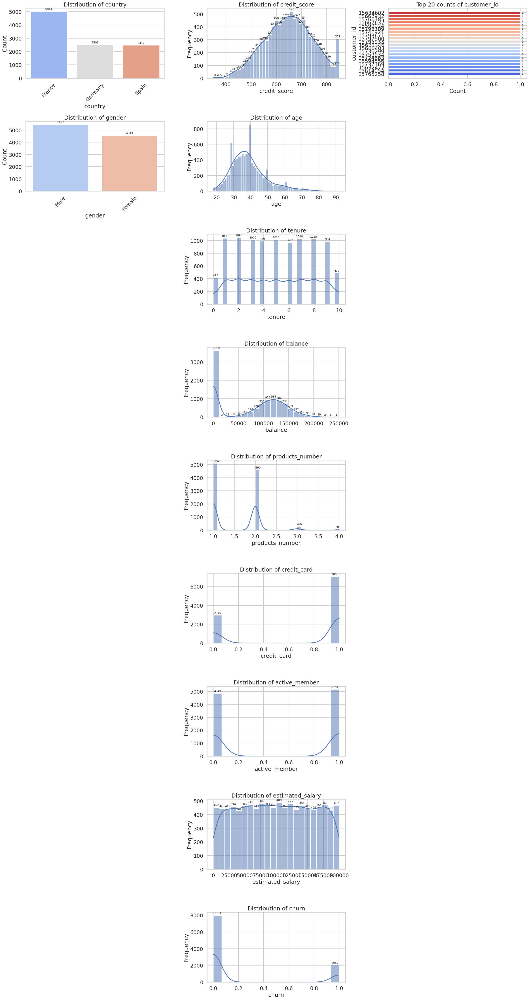

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def analysis_graph(
    data: pd.DataFrame,
    exclude_cols: list[str] | None = None,   # kolom kategorikal yang diperlakukan khusus (ID, dsb)
    top_k_excluded: int = 20,                # berapa nilai teratas yang ditampilkan untuk kolom exclude
    palette: str = "coolwarm",               # palette umum
    top_k_categorical: int | None = None,    # opsional: batasi kategori non-exclude (mis. 30) biar ringan
    max_hist_labels: int = 60                # NEW: batas jumlah label di histogram agar tidak berantakan
):
    """
    Layout:
      - Kolom 1: countplot untuk kolom kategorikal (non-excluded)
      - Kolom 2: histplot untuk kolom numerik + LABEL tiap bin
      - Kolom 3: bar chart value_counts() (Top-K) untuk kolom EXCLUDED
    """
    sns.set_theme(style="whitegrid", context="talk")

    exclude_cols = exclude_cols or []
    exclude_set = set(exclude_cols)

    # deteksi tipe
    obj_all = data.select_dtypes(include=["object", "category"]).columns.tolist()
    num_all = data.select_dtypes(include=[np.number]).columns.tolist()

    obj_excl = [c for c in obj_all if c in exclude_set]     # ke kolom ke-3
    obj_norm = [c for c in obj_all if c not in exclude_set] # ke kolom ke-1

    nrows = max(len(obj_norm), len(num_all), len(obj_excl), 1)
    fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(24, 5*nrows))

    # pastikan axes 2D
    if nrows == 1:
        axes = np.array([axes])
    axes = np.atleast_2d(axes)

    # helper anotasi bar (countplot & barh)
    def _annotate_bar(ax, horizontal=False):
        for p in ax.patches:
            if horizontal:
                ax.annotate(f'{p.get_width():.0f}',
                            (p.get_width(), p.get_y() + p.get_height()/2),
                            ha='left', va='center', fontsize=9, xytext=(5, 0),
                            textcoords='offset points')
            else:
                ax.annotate(f'{p.get_height():.0f}',
                            (p.get_x() + p.get_width()/2, p.get_height()),
                            ha='center', va='bottom', fontsize=9, xytext=(0, 3),
                            textcoords='offset points')

    # NEW: helper anotasi histogram (tiap bin)
    def _annotate_hist(ax):
        bars = [p for p in ax.patches if p.get_width() > 0]
        # hindari clutter kalau bin terlalu banyak
        if len(bars) > max_hist_labels:
            return
        for p in bars:
            h = p.get_height()
            if h > 0:
                ax.annotate(f'{h:.0f}',
                            (p.get_x() + p.get_width()/2., h),
                            ha='center', va='bottom', fontsize=9, xytext=(0, 3),
                            textcoords='offset points')

    for i in range(nrows):
        # === Kolom 1: kategorikal (non-excluded) ===
        ax1 = axes[i, 0]
        if i < len(obj_norm):
            col = obj_norm[i]
            s = data[col].astype("category")
            if top_k_categorical is not None and s.nunique(dropna=False) > top_k_categorical:
                top = s.value_counts(dropna=False).index[:top_k_categorical]
                s = s.where(s.isin(top), other="__OTHER__")
            order = s.value_counts(dropna=False).index.tolist()
            horiz = len(order) > 6
            if horiz:
                sns.countplot(y=s, order=order, palette=palette, ax=ax1)
                ax1.set_xlabel("Count"); ax1.set_ylabel(col)
            else:
                sns.countplot(x=s, order=order, palette=palette, ax=ax1)
                ax1.set_ylabel("Count"); ax1.set_xlabel(col)
                ax1.tick_params(axis="x", rotation=45)
            ax1.set_title(f"Distribution of {col}")
            _annotate_bar(ax1, horizontal=horiz)
        else:
            ax1.axis("off")

        # === Kolom 2: numerik (dengan LABEL tiap bin) ===
        ax2 = axes[i, 1]
        if i < len(num_all):
            col = num_all[i]
            sns.histplot(data=data, x=col, kde=True, stat='count', ax=ax2)
            ax2.set_title(f"Distribution of {col}")
            ax2.set_xlabel(col); ax2.set_ylabel("Frequency")
            _annotate_hist(ax2)  # <<— tambahkan label bin
        else:
            ax2.axis("off")

        # === Kolom 3: excluded kategorikal → value_counts (Top-K) ===
        ax3 = axes[i, 2]
        if i < len(obj_excl):
            col = obj_excl[i]
            vc = (data[col]
                  .astype(str)
                  .value_counts(dropna=False)
                  .head(top_k_excluded))
            y = list(reversed(vc.index.tolist()))
            x = list(reversed(vc.values.tolist()))
            colors = sns.color_palette(palette, n_colors=len(vc))
            ax3.barh(y, x, color=colors)
            for j, val in enumerate(x):
                ax3.annotate(f"{val}", (val, j), va="center", ha="left",
                             xytext=(5, 0), textcoords="offset points", fontsize=9)
            ax3.set_title(f"Top {top_k_excluded} counts of {col}")
            ax3.set_xlabel("Count"); ax3.set_ylabel(col)
        else:
            ax3.axis("off")

    plt.tight_layout()
    plt.show()
analysis_graph(
    df,
    exclude_cols=["customer_id"],
    top_k_excluded=20,
    palette="coolwarm",
    top_k_categorical=30,
    max_hist_labels=60   # kalau bin < 60 → semua diberi label
)


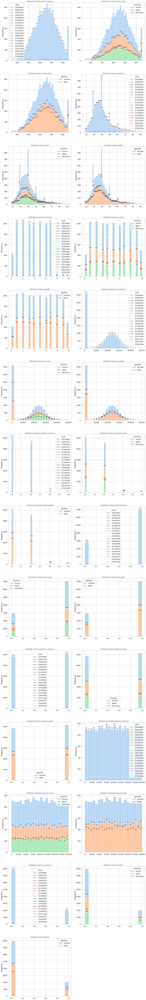

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def analysis_bivariate_graph(
    data: pd.DataFrame,
    exclude_cols: list[str] | None = None,   # kolom kategorikal “berat” (ID dsb)
    top_k_excluded: int = 20,                # ambil Top-K level untuk hue yang di-exclude
    hue_palette: str = "pastel"              # palette warna untuk hue
):
    object_data_type = data.select_dtypes(include=['object', 'category']).columns.to_list()
    numeric_data_type = data.select_dtypes(exclude=['object', 'category']).columns.to_list()

    total_plots = len(object_data_type) * len(numeric_data_type)
    # layout tetap 2 kolom seperti kode asli
    nrows = (total_plots // 2) + (total_plots % 2)
    plt.figure(figsize=(20, total_plots * 5))

    i = 0
    for analysis in numeric_data_type:
        if analysis not in data.columns or not pd.api.types.is_numeric_dtype(data[analysis]):
            continue
        for hue in object_data_type:
            if hue not in data.columns:
                continue
            i += 1
            ax = plt.subplot(nrows, 2, i)

            # ----- siapkan hue -----
            use_data = data[[analysis, hue]].dropna(subset=[analysis]).copy()
            # kalau hue di-exclude → kompres Top-K
            if exclude_cols and hue in set(exclude_cols):
                s = use_data[hue].astype(str)
                vc = s.value_counts(dropna=False)
                top_levels = vc.index[:top_k_excluded].tolist()
                # map selain top → "__OTHER__"
                s = s.where(s.isin(top_levels), "__OTHER__")
                use_data["_hue"] = s
                # ingin urutan legend = top_levels (+ __OTHER__ jika ada)
                hue_order = top_levels + (["__OTHER__"] if "__OTHER__" in s.values else [])
                ax = sns.histplot(
                    data=use_data,
                    x=analysis,
                    hue="_hue",
                    multiple='stack',
                    kde=False,
                    hue_order=hue_order,
                    palette=hue_palette
                )
            else:
                # perilaku asli
                ax = sns.histplot(
                    data=use_data,
                    x=analysis,
                    hue=hue,
                    multiple='stack',
                    kde=False,
                    palette=hue_palette
                )

            plt.title(f"Distribution of {analysis} by {hue}", fontsize=12)
            plt.xlabel("")
            plt.ylabel("Frequency")

            # anotasi tiap bar (sesuai kode kamu)
            for p in ax.patches:
                height = int(p.get_height())
                if height > 0:
                    ax.annotate(
                        f'{height}',
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom',
                        fontsize=10, color='black',
                        xytext=(0, 5), textcoords='offset points'
                    )

    plt.tight_layout()
    plt.show()
# contoh: customer_id bikin berat → exclude
analysis_bivariate_graph(
    df,
    exclude_cols=["customer_id"],   # pakai Top-K + __OTHER__ utk hue ini
    top_k_excluded=20,              # ubah sesuai kebutuhan
    hue_palette="pastel"
)


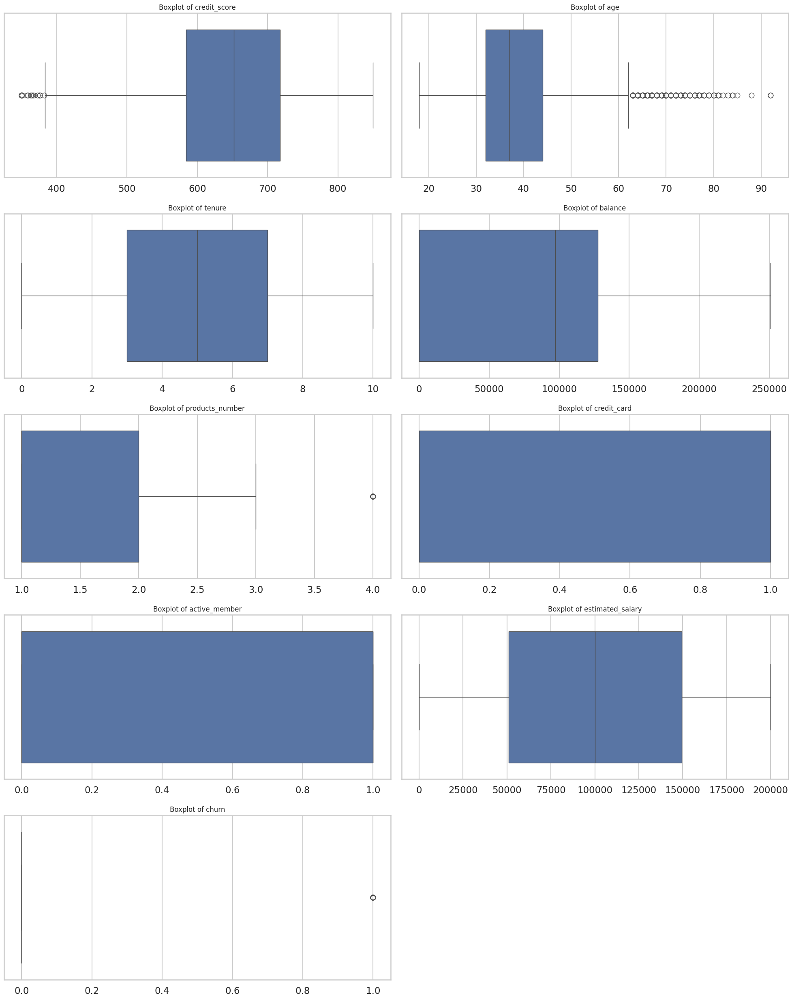

In [7]:
def analysis_boxplot(data):
    numeric_data_type = data.select_dtypes(exclude=['object','datetime']).columns.to_list()
    total_plots = len(numeric_data_type)

    # Perbaikan 1: Gunakan jumlah baris yang lebih tepat
    num_rows = (total_plots + 1) // 2  # Pembagian integer, bulatkan ke atas
    plt.figure(figsize=(20, num_rows * 5))  # Sesuaikan tinggi figure

    for i, analysis in enumerate(numeric_data_type):
        plt.subplot(num_rows, 2, i + 1)  # Perbaikan 2: Gunakan i+1
        sns.boxplot(data=data, x=analysis)
        plt.title(f"Boxplot of {analysis}", fontsize=12)
        plt.xlabel(None) #Perbaikan 3
        plt.ylabel(None) #Perbaikan 4

    plt.tight_layout()
    plt.show()
analysis_boxplot(df)

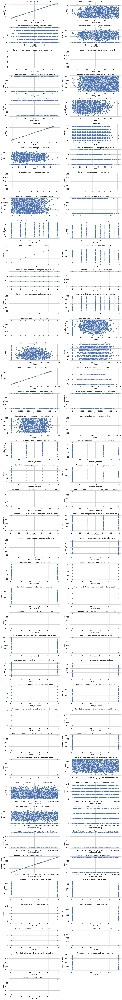

In [8]:
def correlation_analysis(data):
    numeric_data_type = df.select_dtypes(exclude=['object']).columns.to_list()
    total_plots = len(numeric_data_type)**2
    plt.figure(figsize=(20,(total_plots//2)*4))
    i = 0
    for cor1 in numeric_data_type:
        for cor2 in numeric_data_type:
            i += 1
            plt.subplot((total_plots//2)+1,2,i)
            sns.scatterplot(data = data, x = cor1, y = cor2)
            plt.title(f"Correlation between {cor1} and {cor2}")
            plt.xlabel(cor1)
            plt.ylabel(cor2)
    plt.tight_layout()
    plt.show()
correlation_analysis(df)

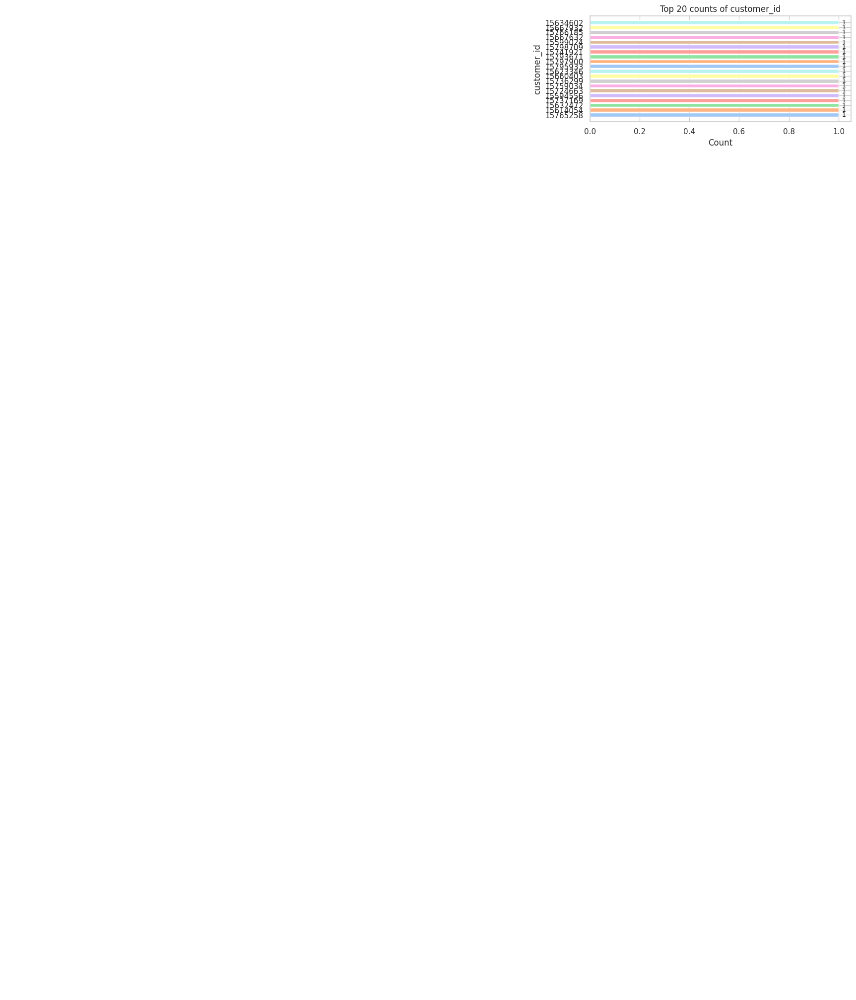

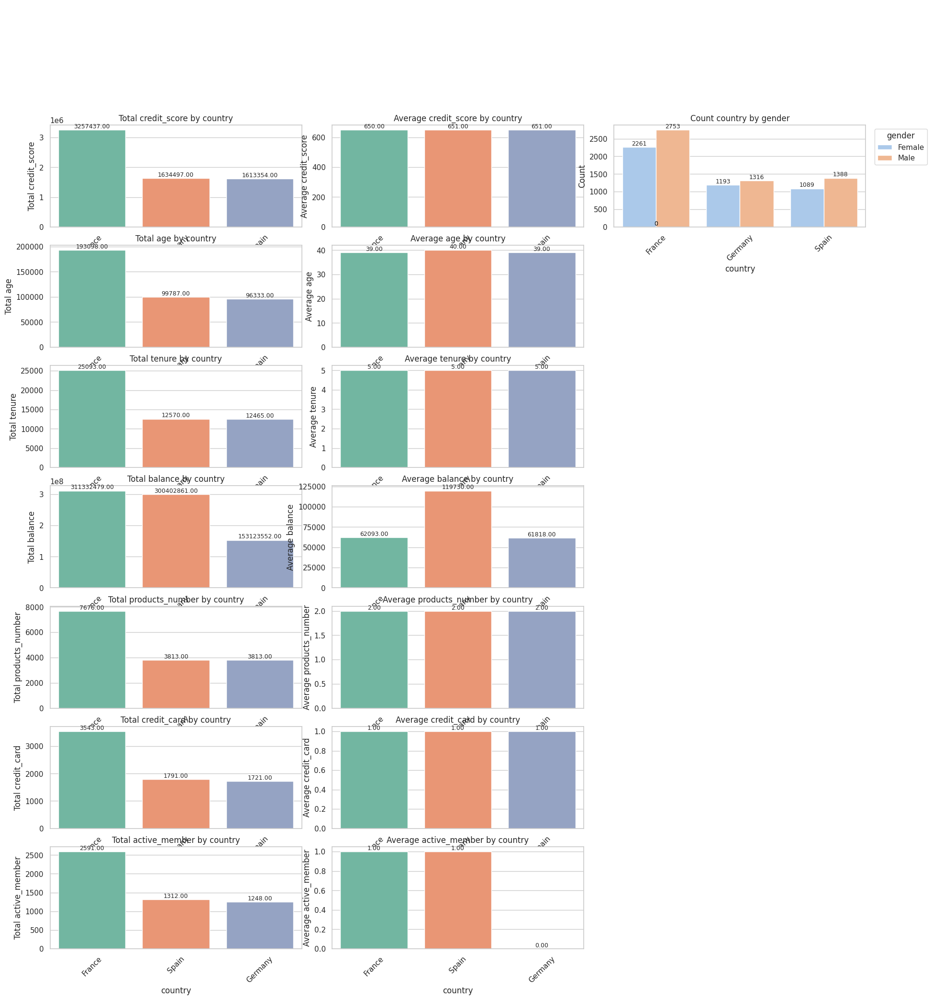

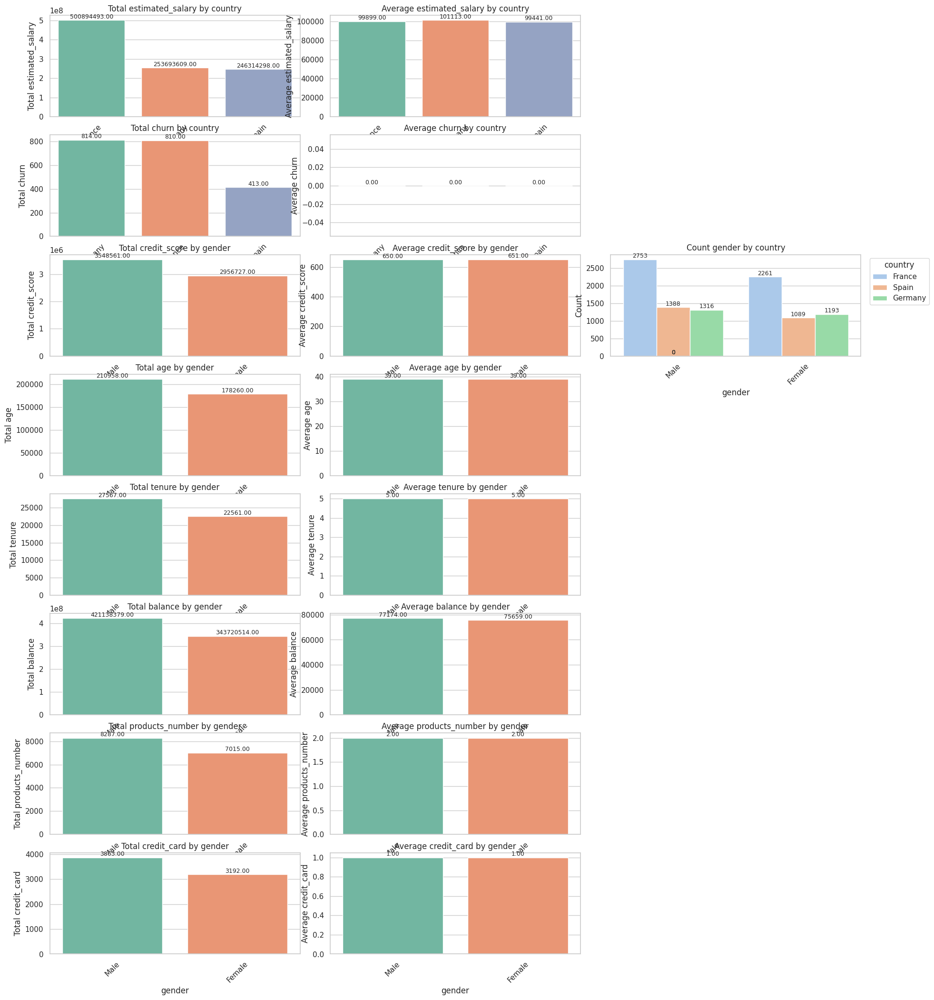

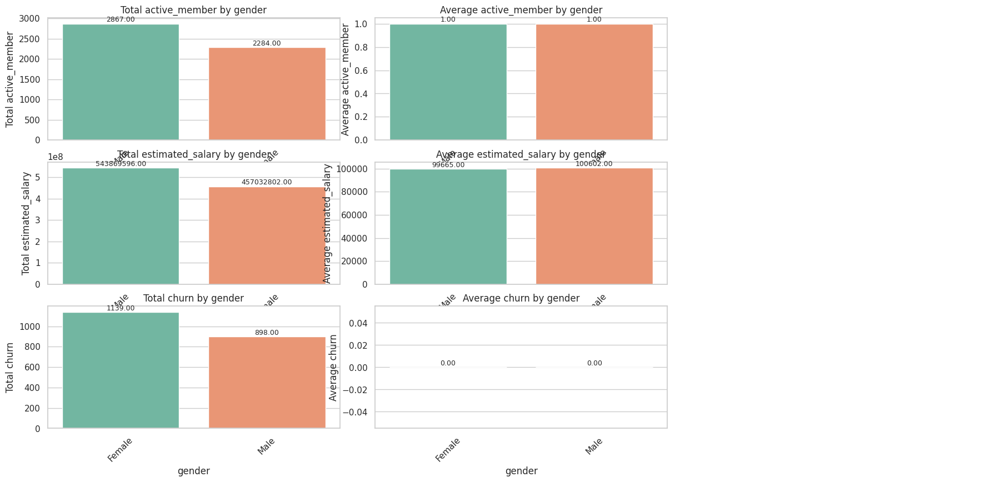

In [11]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid")
sns.set_context("notebook", font_scale=1.0)

def analyze_detail(
    data: pd.DataFrame,
    categories: list[str],
    values: list[str],
    palette: str = "Set2",
    hue_palette: str = "pastel",
    max_hue_levels: int = 8,
    pair_map: dict[str, str] | None = None,
    exclude_cols: list[str] | None = None,
    top_k_excluded: int = 20,
    rows_per_page: int | None = None,
    fig_width: float = 22,
    row_height: float = 3.2,
    wspace: float = 0.12,
    hspace: float = 0.18,
):
    exclude_set = set(exclude_cols or [])

    cats = [c for c in categories if c in data.columns]
    nums = [v for v in values if v in data.columns and pd.api.types.is_numeric_dtype(data[v])]

    if pair_map is None:
        pair_map = {}
        nunq = {c: data[c].nunique(dropna=True) for c in cats}
        for c in cats:
            candidates = [x for x in cats if x != c]
            good = [x for x in candidates if 2 <= nunq.get(x, 0) <= max_hue_levels]
            if good:
                pair_map[c] = sorted(good, key=lambda x: nunq[x])[0]
            else:
                alt = [x for x in candidates if nunq.get(x, 0) >= 2]
                pair_map[c] = (sorted(alt, key=lambda x: nunq[x])[0] if alt else None)

    num_categories = len(cats)
    num_values = max(1, len(nums))
    nrows_total = num_categories * num_values
    ncols = 3

    def _bar_annot(ax, horizontal=False, fmt='{:.2f}'):
        for p in ax.patches:
            if horizontal:
                ax.annotate(fmt.format(p.get_width()),
                            (p.get_width(), p.get_y() + p.get_height()/2),
                            ha='left', va='center', fontsize=9, xytext=(5, 0),
                            textcoords='offset points')
            else:
                ax.annotate(fmt.format(p.get_height()),
                            (p.get_x() + p.get_width()/2, p.get_height()),
                            ha='center', va='center', fontsize=9, xytext=(0, 5),
                            textcoords='offset points')

    # khusus untuk COUNT (integer label)
    def _annot_count(ax, horizontal=False):
        _bar_annot(ax, horizontal=horizontal, fmt='{:.0f}')

    if rows_per_page is None or rows_per_page <= 0:
        rows_per_page = nrows_total
    pages = math.ceil(nrows_total / rows_per_page)

    for page in range(pages):
        start_idx = page * rows_per_page
        end_idx = min(nrows_total, start_idx + rows_per_page)
        page_rows = end_idx - start_idx

        fig, axes = plt.subplots(
            nrows=page_rows, ncols=ncols,
            figsize=(fig_width, row_height * page_rows),
            constrained_layout=False,
            gridspec_kw={'wspace': wspace, 'hspace': hspace}
        )
        if page_rows == 1:
            axes = np.reshape(axes, (1, ncols))
        elif axes.ndim == 1:
            axes = axes.reshape(page_rows, ncols)

        for ci, category in enumerate(cats):
            for vi, value in enumerate(nums if len(nums) > 0 else [None]):
                r_global = ci * num_values + vi
                if not (start_idx <= r_global < end_idx):
                    continue
                r = r_global - start_idx

                ax_sum, ax_mean, ax_cnt = axes[r, 0], axes[r, 1], axes[r, 2]
                is_excluded = category in exclude_set

                # --- SUM/MEAN (tetap)
                if is_excluded or value is None:
                    ax_sum.axis("off"); ax_mean.axis("off")
                else:
                    sum_analyze  = (data.groupby(category, dropna=False)[value].sum()
                                    .round(0).sort_values(ascending=False).reset_index())
                    mean_analyze = (data.groupby(category, dropna=False)[value].mean()
                                    .round(0).sort_values(ascending=False).reset_index())
                    order = sum_analyze[category].tolist()
                    n_cats = len(order)
                    try:
                        pal = sns.color_palette(palette, n_colors=n_cats)
                    except Exception:
                        pal = sns.color_palette("tab20", n_colors=n_cats)

                    horiz = n_cats > 6
                    if horiz:
                        sns.barplot(data=sum_analyze, x=value, y=category, order=order,
                                    palette=pal, ax=ax_sum, orient='h')
                        ax_sum.set_title(f"Total {value} by {category}", pad=6)
                        ax_sum.set_xlabel(f"Total {value}"); ax_sum.set_ylabel(category)
                        _bar_annot(ax_sum, horizontal=True)
                    else:
                        sns.barplot(data=sum_analyze, x=category, y=value, order=order,
                                    palette=pal, ax=ax_sum)
                        ax_sum.set_title(f"Total {value} by {category}", pad=6)
                        ax_sum.set_xlabel(category); ax_sum.set_ylabel(f"Total {value}")
                        ax_sum.tick_params(axis="x", rotation=45)
                        _bar_annot(ax_sum, horizontal=False)

                    if horiz:
                        sns.barplot(data=mean_analyze, x=value, y=category, order=order,
                                    palette=pal, ax=ax_mean, orient='h')
                        ax_mean.set_title(f"Average {value} by {category}", pad=6)
                        ax_mean.set_xlabel(f"Average {value}"); ax_mean.set_ylabel(category)
                        _bar_annot(ax_mean, horizontal=True)
                    else:
                        sns.barplot(data=mean_analyze, x=category, y=value, order=order,
                                    palette=pal, ax=ax_mean)
                        ax_mean.set_title(f"Average {value} by {category}", pad=6)
                        ax_mean.set_xlabel(category); ax_mean.set_ylabel(f"Average {value}")
                        ax_mean.tick_params(axis="x", rotation=45)
                        _bar_annot(ax_mean, horizontal=False)

                # --- COUNT (kolom ke-3) dengan label angka
                if vi == 0:
                    if is_excluded:
                        vc = (data[category].astype(str)
                              .value_counts(dropna=False)
                              .head(top_k_excluded))
                        if vc.empty:
                            ax_cnt.axis("off")
                        else:
                            y = list(reversed(vc.index.tolist()))
                            x = list(reversed(vc.values.tolist()))
                            cols = sns.color_palette(hue_palette, n_colors=len(vc))
                            ax_cnt.barh(y, x, color=cols)
                            _annot_count(ax_cnt, horizontal=True)  # << label count
                            ax_cnt.set_title(f"Top {top_k_excluded} counts of {category}", pad=6)
                            ax_cnt.set_xlabel("Count"); ax_cnt.set_ylabel(category)
                    else:
                        hue = pair_map.get(category)
                        if hue is not None and hue in data.columns and hue != category:
                            cp = data[[category, hue]].dropna()
                            hue_counts = cp[hue].value_counts()
                            if hue_counts.index.size > max_hue_levels:
                                keep = hue_counts.index[:max_hue_levels]
                                cp = cp[cp[hue].isin(keep)]
                            n_cat = cp[category].nunique()
                            order_cp = cp[category].value_counts().index.tolist()
                            hue_levels = cp[hue].dropna().unique().tolist()
                            pal_hue = sns.color_palette(hue_palette, n_colors=len(hue_levels))

                            horiz_cp = n_cat > 6
                            if horiz_cp:
                                sns.countplot(data=cp, y=category, hue=hue,
                                              order=order_cp, palette=pal_hue, ax=ax_cnt)
                                ax_cnt.set_xlabel("Count"); ax_cnt.set_ylabel(category)
                                _annot_count(ax_cnt, horizontal=True)   # << label count
                            else:
                                sns.countplot(data=cp, x=category, hue=hue,
                                              order=order_cp, palette=pal_hue, ax=ax_cnt)
                                ax_cnt.set_ylabel("Count"); ax_cnt.set_xlabel(category)
                                ax_cnt.tick_params(axis="x", rotation=45)
                                _annot_count(ax_cnt, horizontal=False)  # << label count

                            ax_cnt.set_title(f"Count {category} by {hue}", pad=6)
                            ax_cnt.legend(title=hue, bbox_to_anchor=(1.02, 1), loc="upper left")
                        else:
                            ax_cnt.axis("off")
                else:
                    ax_cnt.axis("off")

        plt.tight_layout(pad=0.2, w_pad=0.2, h_pad=0.2)
        plt.show()

cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

analyze_detail(
    df,
    categories=cat_cols,
    values=num_cols,
    palette="Set2",
    hue_palette="pastel",
    max_hue_levels=8,
    exclude_cols=["customer_id"],
    top_k_excluded=20,
    rows_per_page=8,          # tampil 8 baris per figure
    fig_width=22,
    row_height=3.2,
    wspace=0.12,
    hspace=0.18
)


## Modelling

In [13]:
df.head()

,customer_id,credit_score,country,gender,age,tenure,balance,products_number,credit_card,active_member,estimated_salary,churn
0,15634602,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,15647311,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,15619304,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,15701354,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,15737888,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


=== Logistic Regression ===
Accuracy: 0.8095
Precision: 0.6083333333333333
Recall: 0.17936117936117937
F1: 0.27703984819734345
ROC AUC: 0.7736503838198754

Confusion Matrix:



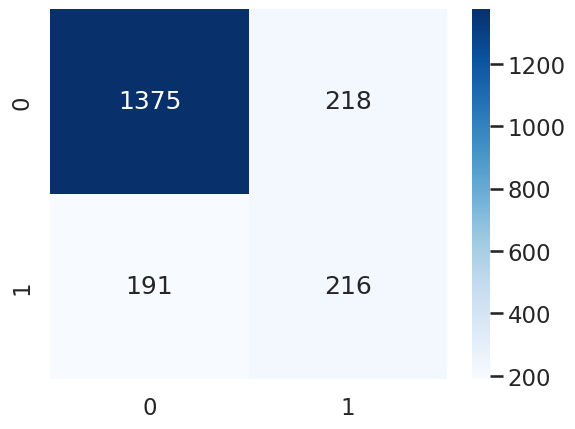


Classification Report:
               precision    recall  f1-score   support

           0       0.82      0.97      0.89      1593
           1       0.61      0.18      0.28       407

    accuracy                           0.81      2000
   macro avg       0.72      0.57      0.58      2000
weighted avg       0.78      0.81      0.77      2000



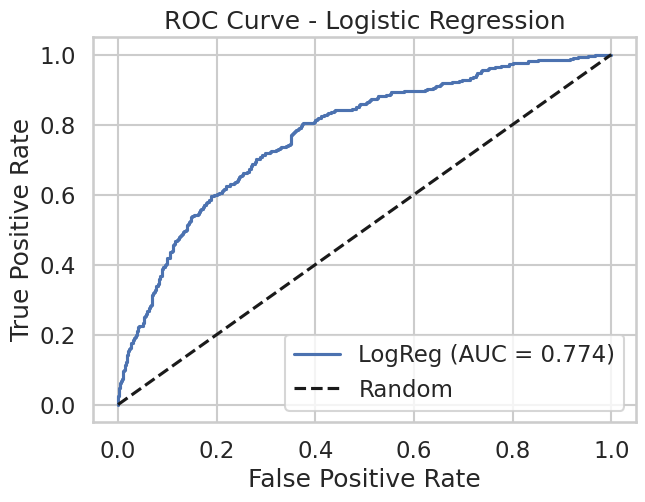


=== Decision Tree ===
Accuracy: 0.7955
Precision: 0.4976958525345622
Recall: 0.5307125307125307
F1: 0.5136741973840666
ROC AUC: 0.6969319087963155

Confusion Matrix:



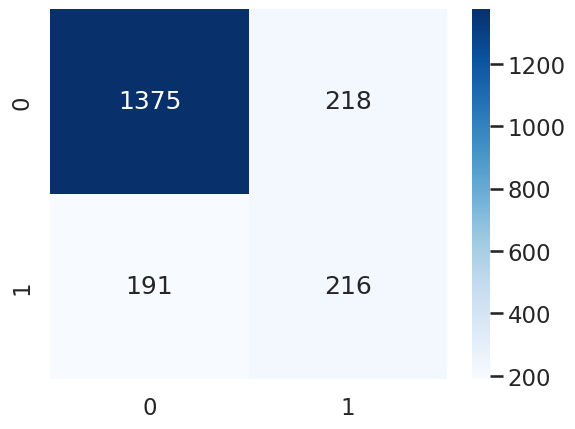


Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.86      0.87      1593
           1       0.50      0.53      0.51       407

    accuracy                           0.80      2000
   macro avg       0.69      0.70      0.69      2000
weighted avg       0.80      0.80      0.80      2000



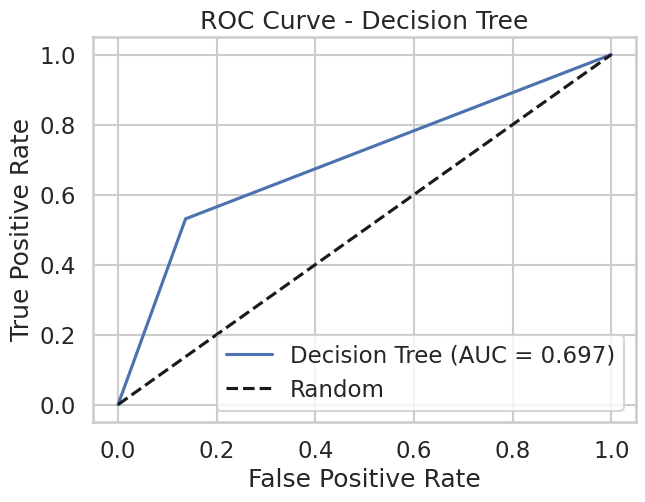

[0 0 0 0 0]
[0.12008779 0.28329569 0.11459896 0.14963668 0.09841293]


In [21]:
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    classification_report, confusion_matrix, accuracy_score,
    f1_score, roc_auc_score, roc_curve, recall_score, precision_score
)
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- 0) Pisah X, y (drop kolom ID)
X = df.drop(columns=['customer_id', 'churn'])
y = df['churn']

# Kalau y bukan 0/1, encode ke 0/1
if not np.issubdtype(y.dtype, np.number):
    le_y = LabelEncoder()
    y = le_y.fit_transform(y)   # positif = kelas dengan label 1 (cek le_y.classes_ kalau perlu)
else:
    le_y = None

# --- 1) Split (pakai stratify biar proporsi label terjaga)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# --- 2) Definisikan kolom numerik & kategorikal berdasarkan X_train
numeric_features = X_train.select_dtypes(include=['int64','float64','int32','float32']).columns.tolist()
categorical_features = X_train.select_dtypes(include=['object','category','bool']).columns.tolist()

# --- 3) Preprocessor: imputer + scaler untuk numerik; imputer + OHE untuk kategorikal
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', MinMaxScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('ohe', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # <- ganti ini
])


preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features),
    ],
    remainder='drop'
)

# --- 4) Model 1: Logistic Regression
log_reg = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(max_iter=1000))
])
log_reg.fit(X_train, y_train)

# Prediksi
y_pred = log_reg.predict(X_test)
y_prob = log_reg.predict_proba(X_test)[:, 1]      # untuk AUC/ROC

# Evaluasi
print("=== Logistic Regression ===")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1:", f1_score(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_prob))
print("\nConfusion Matrix:\n")
sns.heatmap(confusion_matrix(y_test, y_pred_dt), annot=True, fmt='d', cmap='Blues')
plt.show()
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
plt.figure(figsize=(7,5))
plt.plot(fpr, tpr, label=f'LogReg (AUC = {roc_auc_score(y_test, y_prob):.3f})')
plt.plot([0,1], [0,1], 'k--', label='Random')
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Logistic Regression'); plt.legend(); plt.grid(True); plt.show()

# --- 5) Model 2: Decision Tree
tree = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42))
])
tree.fit(X_train, y_train)

y_pred_dt = tree.predict(X_test)
y_prob_dt = tree.predict_proba(X_test)[:, 1]

print("\n=== Decision Tree ===")
print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("Precision:", precision_score(y_test, y_pred_dt))
print("Recall:", recall_score(y_test, y_pred_dt))
print("F1:", f1_score(y_test, y_pred_dt))
print("ROC AUC:", roc_auc_score(y_test, y_prob_dt))
print("\nConfusion Matrix:\n", )
sns.heatmap(confusion_matrix(y_test, y_pred_dt), annot=True, fmt='d', cmap='Blues')
plt.show()
print("\nClassification Report:\n", classification_report(y_test, y_pred_dt))

fpr_dt, tpr_dt, thresholds_dt = roc_curve(y_test, y_prob_dt)
plt.figure(figsize=(7,5))
plt.plot(fpr_dt, tpr_dt, label=f'Decision Tree (AUC = {roc_auc_score(y_test, y_prob_dt):.3f})')
plt.plot([0,1], [0,1], 'k--', label='Random')
plt.xlabel('False Positive Rate'); plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Decision Tree'); plt.legend(); plt.grid(True); plt.show()
#save best model based on accuracy
import joblib
best_model = log_reg if accuracy_score(y_test, y_pred) > accuracy_score(y_test, y_pred_dt) else tree
import sklearn, joblib

bundle = {
    "model": best_model,                         # seluruh Pipeline
    "target_encoder": le_y,                      # bisa None kalau y sudah 0/1
    "feature_columns": X_train.columns.tolist(), # referensi kolom saat training
    "sklearn_version": sklearn.__version__
}
joblib.dump(bundle, "model_bundle.joblib")
# Untuk load model nanti
loaded_bundle = joblib.load("model_bundle.joblib")
loaded_model = loaded_bundle["model"]
loaded_target_encoder = loaded_bundle["target_encoder"]
loaded_feature_columns = loaded_bundle["feature_columns"]
loaded_sklearn_version = loaded_bundle["sklearn_version"]
df_new = X_test.iloc[:5].copy()
# df_new: DataFrame baru untuk inferensi
# Pastikan kolom ada semua; kalau ada kolom kurang, isi cepat (misal NaN)
missing = [c for c in loaded_feature_columns if c not in df_new.columns]
for c in missing:
    df_new[c] = pd.NA
df_new = df_new[loaded_feature_columns]  # susun sesuai daftar training (opsional, karena by name)

proba = loaded_model.predict_proba(df_new)[:, 1]
pred  = loaded_model.predict(df_new)

# Kalau mau kembalikan ke label asli:
# kembalikan ke label asli kalau ada encoder target
if le_y is not None:
    pred_labels = le_y.inverse_transform(pred)
    print(pred_labels)
else:
    print(pred)          # 0/1
print(proba)             # probabilitas kelas 1